In [1]:
# This Python 3 environment comes with many helpful analytics libraries installed
# It is defined by the kaggle/python Docker image: https://github.com/kaggle/docker-python
# For example, here's several helpful packages to load

import numpy as np # linear algebra
import pandas as pd # data processing, CSV file I/O (e.g. pd.read_csv)

# Input data files are available in the read-only "../input/" directory
# For example, running this (by clicking run or pressing Shift+Enter) will list all files under the input directory

import os
for dirname, _, filenames in os.walk('C:/Users/Manolo/Downloads/input'):
    for filename in filenames:
        print(os.path.join(dirname, filename))

# You can write up to 20GB to the current directory (/kaggle/working/) that gets preserved as output when you create a version using "Save & Run All" 
# You can also write temporary files to /kaggle/temp/, but they won't be saved outside of the current session

C:/Users/Manolo/Downloads/input\store-sales-time-series-forecasting\holidays_events.csv
C:/Users/Manolo/Downloads/input\store-sales-time-series-forecasting\oil.csv
C:/Users/Manolo/Downloads/input\store-sales-time-series-forecasting\sample_submission.csv
C:/Users/Manolo/Downloads/input\store-sales-time-series-forecasting\stores.csv
C:/Users/Manolo/Downloads/input\store-sales-time-series-forecasting\test.csv
C:/Users/Manolo/Downloads/input\store-sales-time-series-forecasting\train.csv
C:/Users/Manolo/Downloads/input\store-sales-time-series-forecasting\train.csv.zip
C:/Users/Manolo/Downloads/input\store-sales-time-series-forecasting\transactions.csv
C:/Users/Manolo/Downloads/input\store-sales-time-series-forecasting\transactions.csv.zip


In [2]:
#import other libraries
import matplotlib.pyplot as plt
import seaborn as sns
import plotly.express as px

#pandas dataframe configuration
pd.set_option('display.max_columns', None)
pd.options.display.float_format = '{:.4f}'.format

In [3]:
DATA_PATH = 'C:/Users/Manolo/Downloads/input/store-sales-time-series-forecasting/'

In [4]:
for f in os. listdir(DATA_PATH):
    print(f)

holidays_events.csv
oil.csv
sample_submission.csv
stores.csv
test.csv
train.csv
train.csv.zip
transactions.csv
transactions.csv.zip


In [5]:
df_train = pd.read_csv(os.path.join(DATA_PATH, 'train.csv'))
df_test = pd.read_csv(os.path.join(DATA_PATH, 'test.csv'))

df_stores = pd.read_csv(os.path.join(DATA_PATH, 'stores.csv'))
df_transactions = pd.read_csv(os.path.join(DATA_PATH, 'transactions.csv')).sort_values(['store_nbr', 'date'])
df_oil = pd.read_csv(os.path.join(DATA_PATH, 'oil.csv'))
df_holidays = pd.read_csv(os.path.join(DATA_PATH, 'holidays_events.csv'))

In [6]:
#Datetime
df_train["date"] = pd.to_datetime(df_train['date'])
df_test["date"] = pd.to_datetime(df_test['date'])
df_transactions["date"] = pd.to_datetime(df_transactions['date'])

In [7]:
df_train.sales = df_train.sales.astype('float32')
df_stores.cluster = df_stores.cluster.astype('int8')

In [8]:
type(df_train['date'][0])

pandas._libs.tslibs.timestamps.Timestamp

In [9]:
df_train

,id,date,store_nbr,family,sales,onpromotion
0,0,2013-01-01,1,AUTOMOTIVE,0.0000,0
1,1,2013-01-01,1,BABY CARE,0.0000,0
2,2,2013-01-01,1,BEAUTY,0.0000,0
3,3,2013-01-01,1,BEVERAGES,0.0000,0
4,4,2013-01-01,1,BOOKS,0.0000,0
...,...,...,...,...,...,...
3000883,3000883,2017-08-15,9,POULTRY,438.1330,0
3000884,3000884,2017-08-15,9,PREPARED FOODS,154.5530,1
3000885,3000885,2017-08-15,9,PRODUCE,2419.7290,148
3000886,3000886,2017-08-15,9,SCHOOL AND OFFICE SUPPLIES,121.0000,8


In [10]:
average_onpromotion = df_train.groupby('date').mean()['onpromotion']

<AxesSubplot:xlabel='date'>

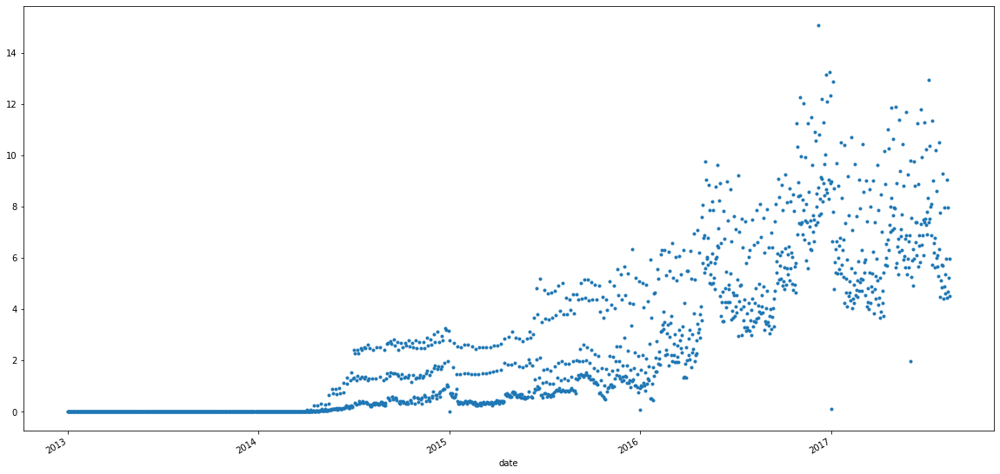

In [11]:
average_onpromotion.plot(style='.', figsize=(20,10))

In [12]:
avg_train = average_onpromotion.copy()

In [13]:
moving_avg = avg_train.rolling(window=365, center=True, min_periods=183).mean()

<AxesSubplot:xlabel='date'>

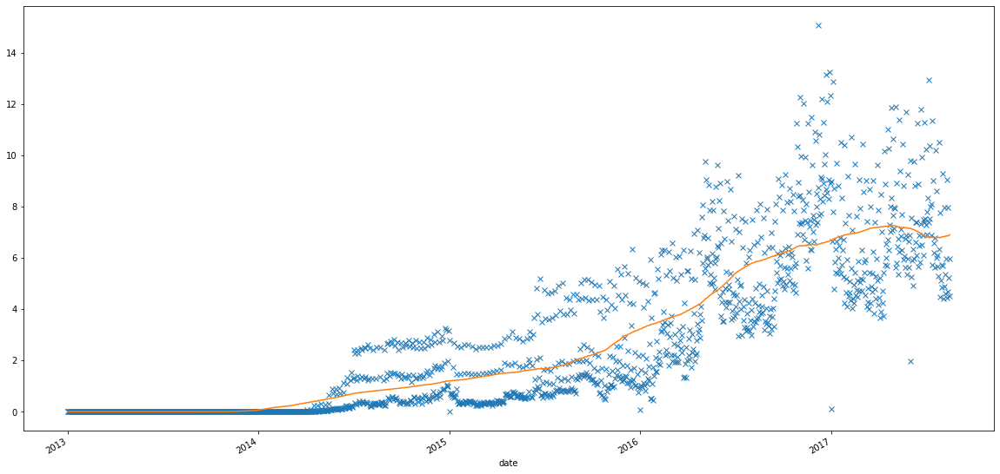

In [14]:
avg_train.plot(style='x', figsize=(20,10));
moving_avg.plot()

In [15]:
df_train_temp = df_train.groupby(['store_nbr', 'onpromotion', 'date']).sales.sum().reset_index()

In [16]:
print(df_stores.columns)
print(df_train.columns)
print(df_transactions.columns)
print(df_holidays.columns)

Index(['store_nbr', 'city', 'state', 'type', 'cluster'], dtype='object')
Index(['id', 'date', 'store_nbr', 'family', 'sales', 'onpromotion'], dtype='object')
Index(['date', 'store_nbr', 'transactions'], dtype='object')
Index(['date', 'type', 'locale', 'locale_name', 'description', 'transferred'], dtype='object')


In [17]:
df_aux_merged = pd.merge(df_train_temp, df_stores, how='left')

In [18]:
df_aux_merged

,store_nbr,onpromotion,date,sales,city,state,type,cluster
0,1,0,2013-01-01,0.0000,Quito,Pichincha,D,13
1,1,0,2013-01-02,7417.1479,Quito,Pichincha,D,13
2,1,0,2013-01-03,5873.2441,Quito,Pichincha,D,13
3,1,0,2013-01-04,5919.8789,Quito,Pichincha,D,13
4,1,0,2013-01-05,6318.7852,Quito,Pichincha,D,13
...,...,...,...,...,...,...,...,...
499877,54,528,2016-05-21,3424.0000,El Carmen,Manabi,C,3
499878,54,536,2016-05-22,4723.0000,El Carmen,Manabi,C,3
499879,54,543,2016-05-29,4710.0000,El Carmen,Manabi,C,3
499880,54,547,2016-05-15,5608.0000,El Carmen,Manabi,C,3


In [19]:
pearson_corr = df_aux_merged.corr('pearson')['onpromotion'].loc['sales']
spearman_corr = df_aux_merged.corr('spearman')['onpromotion'].loc['sales']

In [20]:
print(f'pearson_corr = {pearson_corr:.4f} and spearman corr = {spearman_corr:.4f}')

pearson_corr = 0.1029 and spearman corr = 0.0142


In [21]:
df_sorted_stores = df_aux_merged.sort_values(['cluster', 'date'])

In [22]:
px.line(df_sorted_stores, x='date', y='onpromotion', color='cluster', title='Onpromotion by date and cluster')

In [23]:
aux_a = df_aux_merged.copy()
aux_a['year'] = aux_a.date.dt.year
aux_a['month'] = aux_a['date'].dt.month

pearson_corr = aux_a.corr('pearson')['year'].loc['onpromotion']
spearman_corr = aux_a.corr('spearman')['year'].loc['onpromotion']

In [24]:
print(f'pearson_corr = {pearson_corr:.4f} and spearman corr = {spearman_corr:.4f}')

pearson_corr = 0.1803 and spearman corr = 0.3588


In [25]:
px.box(aux_a, x='year', y='onpromotion', color='month', title='Box plot onpromotion')

In [26]:
aux_a = df_aux_merged.set_index('date').resample('M').onpromotion.mean().reset_index()

In [27]:
aux_a['year'] = aux_a.date.dt.year

In [28]:
px.line(aux_a, x='date', y='onpromotion', color='year', title='Monthly transactions')